## 6. OpenMM (In progress)

### 💡Results Preview （in progress）
- Below shows dynamic BfIMTD in vaccum, the loop fluctuates along the process 

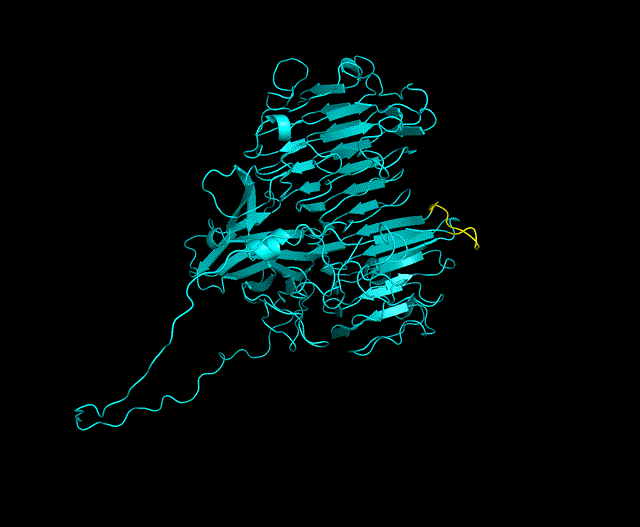

In [1]:
from IPython.display import Image
Image(filename="../results/openmm/gif/imtd_md_movie0.gif")

### 6.1 Deployment
1. create conda environment

In [ ]:
conda create -n openmm-env python=3.10
conda activate openmm-env 

2. install OpenMM
use conda-forge to install openmm pkgs

In [ ]:
conda install -c conda-forge openmm openmmtools -y

3. test if openmm is installed successfully

In [ ]:
python -m openmm.testInstallation

#### output
OpenMM Version: 8.3.1
Git Revision: 6e13f1361dcc3ffb581c7c97e3adfcc61257b813

There are 3 Platforms available:

1 Reference - Successfully computed forces
2 CPU - Successfully computed forces
3 OpenCL - Successfully computed forces

Median difference in forces between platforms:

Reference vs. CPU: 6.28671e-06
Reference vs. OpenCL: 6.72573e-06
CPU vs. OpenCL: 7.67312e-07

All differences are within tolerance.

### 6.2 run OpenMM to simulate loop region
### Step 1: Initial molecular system and energy minimization preparation 
- use the following script to prepare initial environment for each target pdb file
- the following script has been saved as setup_system.py in [scripts]

In [ ]:
from openmm.app import PDBFile, ForceField, Simulation, NoCutoff, HBonds
from openmm import Platform, LangevinIntegrator
from openmm.unit import kelvin, picosecond, picoseconds
import os
import time

input_pdb_path = "target_protein.pdb"  
output_dir = "./results/minimized" 

if not os.path.isfile(input_pdb_path):
    raise FileNotFoundError(f"❌ Input file not found: {input_pdb_path}")

basename = os.path.splitext(os.path.basename(input_pdb_path))[0]
output_filename = os.path.join(output_dir, f"{basename}_minimized.pdb")

os.makedirs(output_dir, exist_ok=True)

In [ ]:
print(f"📥 Loading PDB file: {input_pdb_path}")
pdb = PDBFile(input_pdb_path)

forcefield = ForceField('amber14-all.xml', 'amber14/tip3pfb.xml')
system = forcefield.createSystem(
    pdb.topology,
    nonbondedMethod=NoCutoff,
    constraints=HBonds
)

In [ ]:
integrator = LangevinIntegrator(300*kelvin, 1/picosecond, 0.002*picoseconds)
platform = Platform.getPlatformByName('CPU')

In [ ]:
simulation = Simulation(pdb.topology, system, integrator, platform)
simulation.context.setPositions(pdb.positions)

print("🛠 Starting energy minimization...")
start_time = time.time()
simulation.minimizeEnergy()
end_time = time.time()
print(f"✔️energy minimization complete in {end_time - start_time:.2f} seconds.")

In [ ]:
with open(output_filename, 'w') as f:
    PDBFile.writeFile(simulation.topology,
                      simulation.context.getState(getPositions=True).getPositions(),
                      f)
print(f"Minimized structure saved to: {output_filename}")

simulation.context.getState(getPositions=True, getVelocities=False)

- pdb files after preparation are saved in [results/openmm/preparation]|

### Step 2: Run MD using openmm
- use the following script to run MD for each target pdb

In [ ]:
import time
import os
from openmm.app import PDBFile, ForceField, Simulation, StateDataReporter, DCDReporter, NoCutoff, HBonds
from openmm import Platform, LangevinIntegrator
from openmm.unit import kelvin, picosecond, picoseconds

input_pdb_path = "your_protein_minimized.pdb" 
output_dir = "./results/simulation" 

if not os.path.isfile(input_pdb_path):
    raise FileNotFoundError(f"❌ Input PDB file not found: {input_pdb_path}")

basename = os.path.splitext(os.path.basename(input_pdb_path))[0]
os.makedirs(output_dir, exist_ok=True)

In [ ]:
dcd_filename = os.path.join(output_dir, f"{basename}.dcd")
log_filename = os.path.join(output_dir, f"{basename}_log.txt")

In [ ]:
forcefield = ForceField('amber14-all.xml', 'amber14/tip3pfb.xml')
system = forcefield.createSystem(pdb.topology, nonbondedMethod=NoCutoff, constraints=HBonds)

integrator = LangevinIntegrator(300*kelvin, 1/picosecond, 0.002*picoseconds)
platform = Platform.getPlatformByName('CPU')

simulation = Simulation(pdb.topology, system, integrator, platform)
simulation.context.setPositions(pdb.positions)

In [ ]:
simulation.reporters.append(DCDReporter(dcd_filename,100))
simulation.reporters.append(StateDataReporter(sys.stdout, 100, temperature=True, potentialEnergy=True, progress=True, remainingTime=True, totalSteps=50000, speed=True))
simulation.reporters.append(StateDataReporter(log_filename, 100, potentialEnergy=True, totalSteps=50000, speed=True))

In [ ]:
print("🚀 Starting MD simulation...")
start = time.time()
simulation.step(50000)
end = time.time()

print(f"✅ Simulation completed in {(end - start):.2f} seconds.")
print(f"🧪 Trajectory saved to: {dcd_filename}")
print(f"📝 Log saved to: {log_filename}")

- results after preparation are saved in [results/openmm/md_results]|

### Step 3: Analyze the results
- using the following script to analyze the results
####  First, visualize RMSF root mean square fluctuation

In [ ]:
import mdtraj as md
import numpy as np
import matplotlib.pyplot as plt
import os

In [ ]:
traj_path = "results/simulation/protein_minimized.dcd"  # Trajectory file
topology_path = "results/minimized/protein_minimized.pdb"  # PDB file
start_res = 392  # Residue range start (1-based)
end_res = 402    # Residue range end (1-based)
output_dir = "results/analysis"  # Output folder for saving RMSF plot

if not os.path.isfile(traj_path) or not os.path.isfile(topology_path):
    raise FileNotFoundError("❌ Trajectory or topology file not found. Please check the paths.")

os.makedirs(output_dir, exist_ok=True)

In [ ]:
print(f"📥 Loading trajectory from: {traj_path}")
traj = md.load(traj_path, top=topology_path)

In [ ]:
loop_atoms = traj.topology.select(f"resid {start_res - 1} to {end_res - 1} and name CA")
print(f"🧬 Loop region CA atoms selected: {loop_atoms.shape[0]} atoms")

In [ ]:
rmsf = md.rmsf(traj, traj[0], atom_indices=loop_atoms)

plt.figure(figsize=(8, 4))
res_ids = list(range(start_res, end_res + 1))
plt.plot(res_ids, rmsf)
plt.xlabel("Residue ID")
plt.ylabel("RMSF (nm)")
plt.title("Loop Region Flexibility")
plt.grid(True)
plt.tight_layout()

basename = os.path.splitext(os.path.basename(traj_path))[0]
plot_path = os.path.join(output_dir, f"{basename}_rmsf_loop_{start_res}_{end_res}.png")
plt.savefig(plot_path)
plt.show()

print(f"✅ RMSF plot saved to: {plot_path}")

In [ ]:
load protein.pdb
load_traj protein_MD.dcd, protein_name

In [ ]:
# output gif
mpng md_frame # pymol

cd /path/to/your/frames # bash

ffmpeg -r 10 -i md_frame%04d.png -vf "scale=640:-1" imtd_md_movie0.gif # bash